In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams['figure.figsize'] = (20,10)
plt.rcParams['figure.dpi'] = 300
import seaborn as sns
sns.set_theme(style='darkgrid', palette='rainbow')
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error
import plotly.express as px
import plotly.graph_objects as go

In [2]:
df=pd.read_csv("Gold_data (1).csv")
df

,date,price
0,2016-01-01,2252.60
1,2016-01-02,2454.50
2,2016-01-03,2708.10
3,2016-01-04,2577.80
4,2016-01-05,2597.75
...,...,...
2177,2021-12-17,4394.40
2178,2021-12-18,4389.50
2179,2021-12-19,4389.50
2180,2021-12-20,4354.10


In [3]:
df.isnull().sum()

date     0
price    0
dtype: int64

In [4]:
df.dtypes

date      object
price    float64
dtype: object

In [5]:
df['date'] = pd.to_datetime(df['date'])

In [6]:
df.dtypes

date     datetime64[ns]
price           float64
dtype: object

In [7]:
df.describe()

,price
count,2182.000000
mean,3284.450046
std,719.564434
min,2252.600000
25%,2697.020000
50%,2879.800000
75%,4147.325000
max,4966.300000


In [8]:
df.set_index('date', inplace=True)

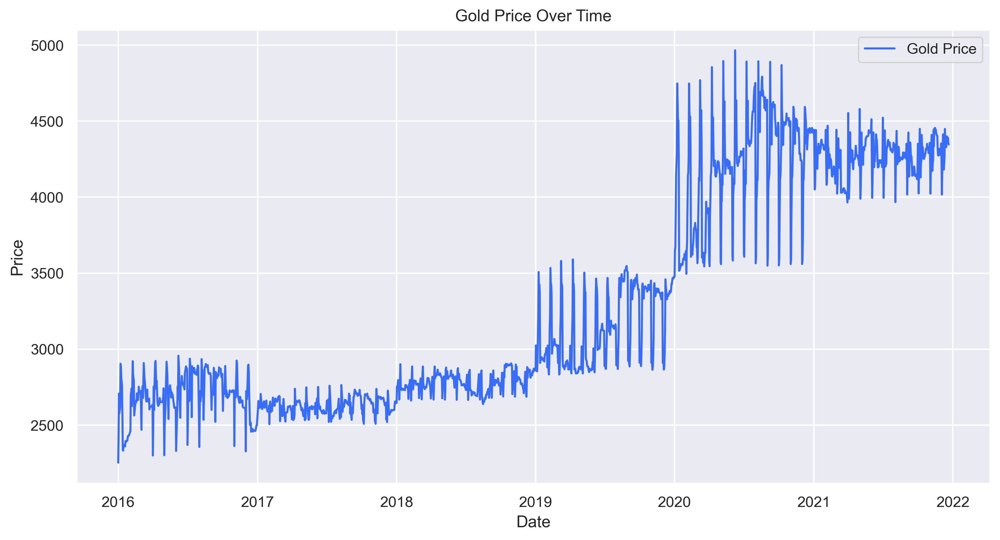

In [9]:
# Plotting the gold prices

plt.figure(figsize=(12, 6))
plt.plot(df['price'], label='Gold Price')
plt.title('Gold Price Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

- can't understand anything looking at this general price distrubation graph  

In [10]:
################################################################################################################################

In [11]:
# Calculating moving averages

df['30_day_MA'] = df['price'].rolling(window=30).mean()
df['90_day_MA'] = df['price'].rolling(window=90).mean()

Why Use Moving Averages?
- Smoothing Data: Moving averages help smooth out short-term fluctuations and highlight longer-term trends in the data.
- Trend Analysis: They are useful for identifying the direction of the trend. For example, if the 30-day moving average is above the 90-day moving average, it might indicate an upward trend

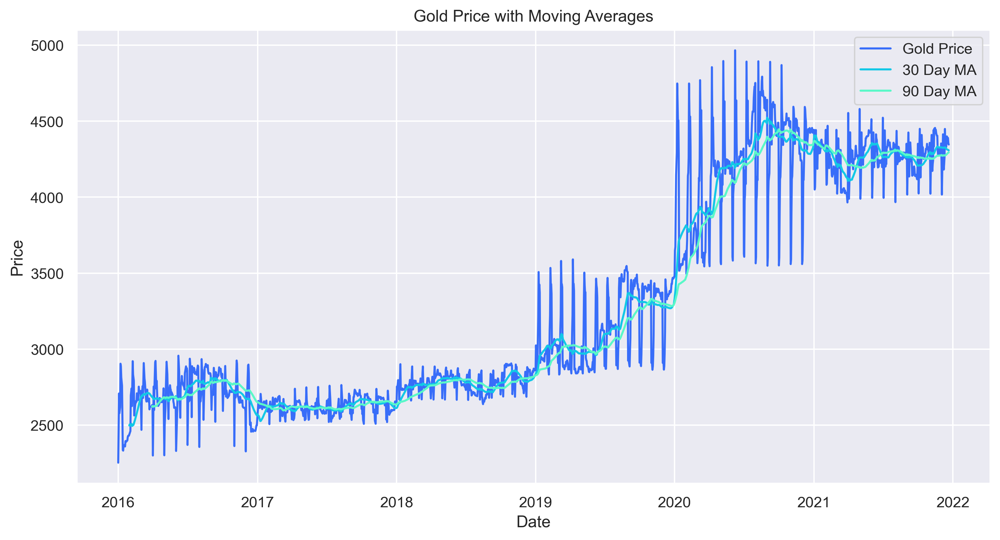

In [12]:
# Plotting moving averages

plt.figure(figsize=(12, 6))
plt.plot(df['price'], label='Gold Price')
plt.plot(df['30_day_MA'], label='30 Day MA')
plt.plot(df['90_day_MA'], label='90 Day MA')
plt.title('Gold Price with Moving Averages')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

In [13]:
fig = go.Figure()

# Add stock prices
fig.add_trace(go.Scatter(
    x=df.index, y=df['price'],
    mode='lines', name='Gold Price'
))

# Add 30-day moving average
fig.add_trace(go.Scatter(
    x=df.index, y=df['30_day_MA'],
    mode='lines', name='30 Day MA'
))

# Add 90-day moving average
fig.add_trace(go.Scatter(
    x=df.index, y=df['90_day_MA'],
    mode='lines', name='90 Day MA'
))

fig.update_layout(
    title='Gold Prices with Moving Averages',
    xaxis_title='Date',
    yaxis_title='Price'
)

fig.show()

- There are periods where the gold price is consistently above both moving averages, indicating a strong upward trend

- When the gold price is above the moving averages, it indicates an upward trend, and when it is below, it indicates a downward trend.

- The 30-day moving average reacts more quickly to price changes compared to the 90-day moving average. This can be useful for short-term trading strategies, while the 90-day moving average is more suitable for long-term trend analysis.

- 30 day MA smooths out short-term fluctuations and highlights the short-term trend in gold prices
- 90 day MA provides a smoother curve compared to the 30-day moving average, highlighting the medium-term trend in gold prices

In [14]:
################################################################################################################################

In [15]:
# Calculating daily returns
df['daily_return'] = df['price'].pct_change()

Why Are Daily Returns Important?
- Volatility Measurement: Daily returns help measure the volatility of a stock. High volatility means the stock price changes significantly from day to day.
- Performance Analysis: By analyzing daily returns, you can assess the performance of a stock over time.
- Risk Assessment: Understanding daily returns can help in assessing the risk associated with a stock. Higher variability in daily returns indicates higher risk.

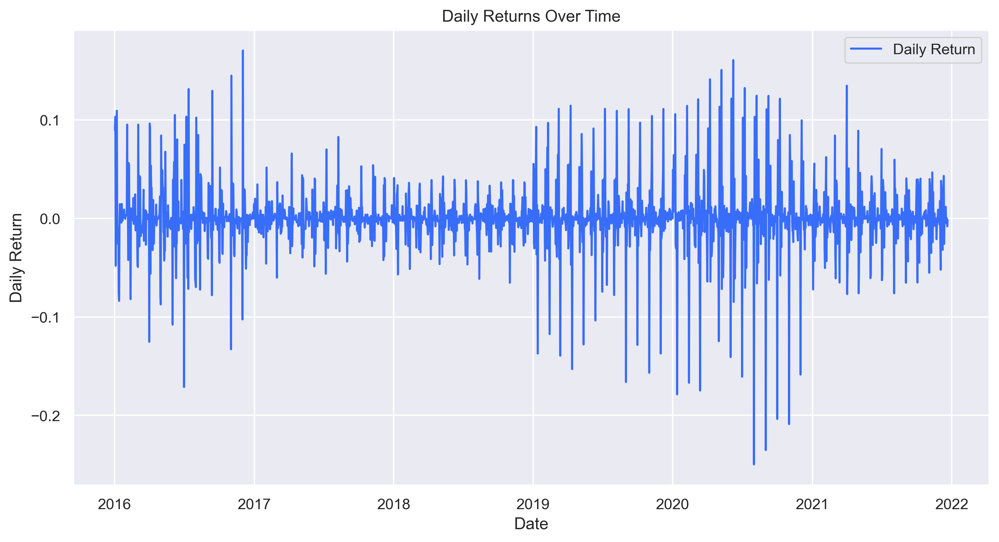

In [16]:
# Plotting daily returns
plt.figure(figsize=(12, 6))
plt.plot(df['daily_return'], label='Daily Return')
plt.title('Daily Returns Over Time')
plt.xlabel('Date')
plt.ylabel('Daily Return')
plt.legend()
plt.show()

In [17]:
fig = go.Figure()

# Add daily returns
fig.add_trace(go.Scatter(
    x=df.index, y=df['daily_return'],
    mode='lines', name='Daily Return'
))

fig.update_layout(
    title='Daily Returns Over Time',
    xaxis_title='Date',
    yaxis_title='Daily Return'
)

fig.show()

In [18]:
# Create histogram
fig = go.Figure()

fig.add_trace(go.Histogram(
    x=df['daily_return'],
    nbinsx=50,  # Number of bins
    name='Daily Returns'
))

fig.update_layout(
    title='Histogram of Daily Returns',
    xaxis_title='Daily Return',
    yaxis_title='Frequency'
)

fig.show()

- Tall peak in the middle shows that avg daily gold price are increaseing by 0 to 0.01%. This means most of the time daily gold price does not change significantly.
- The distribution appears to be roughly symmetrical. This suggests that positive and negative daily returns occur with similar frequencies.
- The spread of the histogram shows that while most returns are close to zero, there are some days with larger positive or negative returns, but these are less frequent.

In [19]:
# Check the distribution of the gold price using a histogram
# Create histogram
fig = go.Figure()

fig.add_trace(go.Histogram(
    x=df['price'],
    nbinsx=50,  # Number of bins
    name='price'
))

fig.update_layout(
    title='Histogram on distribution of the gold price',
    xaxis_title='price',
    yaxis_title='Frequency'
)

fig.show()

- gold price spread from 2200rs to 5000rs
- peaked at 2600 to 2700rs

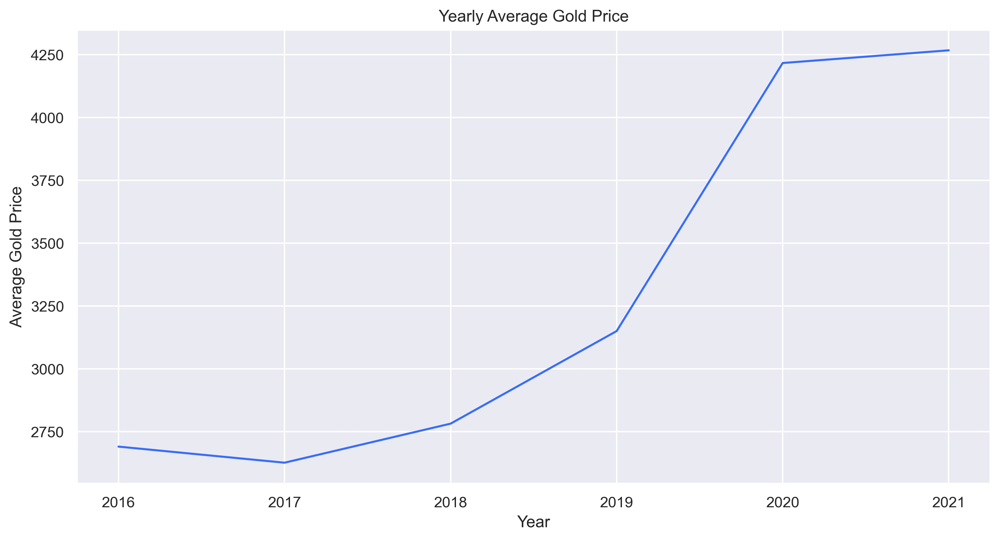

In [20]:
# Analyze seasonality (yearly average)

# Reset the index to access the 'date' column
df = df.reset_index()

# Extract year and month from the 'date' column
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month

# Calculate yearly and monthly averages
yearly_average = df.groupby('year')['price'].mean()
monthly_average = df.groupby('month')['price'].mean()

# Plot the yearly average gold price
plt.figure(figsize=(12, 6))
plt.plot(yearly_average.index, yearly_average.values)
plt.xlabel('Year')
plt.ylabel('Average Gold Price')
plt.title('Yearly Average Gold Price')
plt.grid(True)
plt.show()

- from 2019 to 2020 gold prices shot up really fast 3150rs to 4150rs 

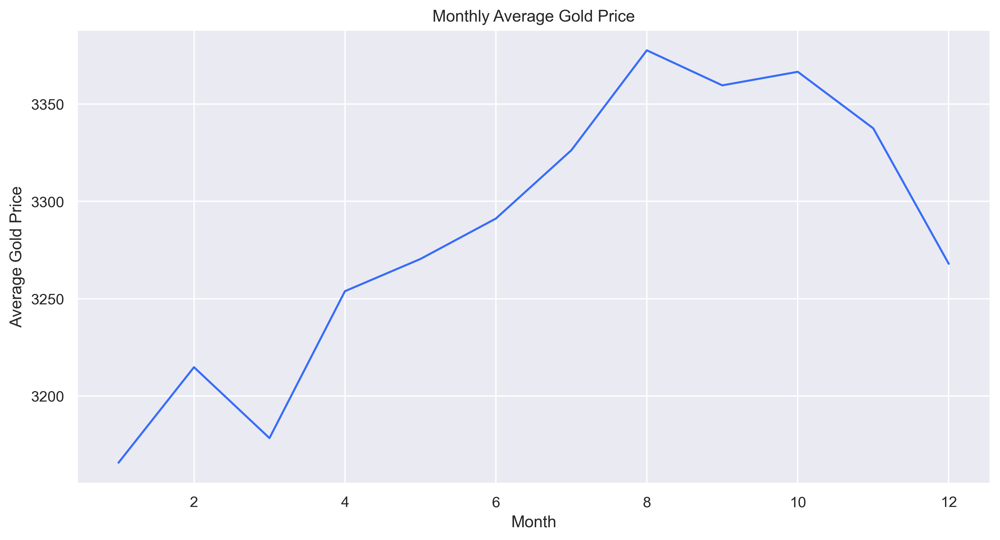

In [21]:
# Analyze seasonality (montly average)

plt.figure(figsize=(12, 6))
plt.plot(monthly_average.index, monthly_average.values)
plt.xlabel('Month')
plt.ylabel('Average Gold Price')
plt.title('Monthly Average Gold Price')
plt.grid(True)
plt.show()

- peak is at 8th month i.e., August month 

In [22]:
#putting date has index column again
df.set_index('date', inplace=True)

In [23]:
df

,price,30_day_MA,90_day_MA,daily_return,year,month
date,,,,,,
2016-01-01,2252.60,NaN,NaN,NaN,2016,1
2016-01-02,2454.50,NaN,NaN,0.089630,2016,1
2016-01-03,2708.10,NaN,NaN,0.103320,2016,1
2016-01-04,2577.80,NaN,NaN,-0.048115,2016,1
2016-01-05,2597.75,NaN,NaN,0.007739,2016,1
...,...,...,...,...,...,...
2021-12-17,4394.40,4313.400000,4286.091111,-0.001227,2021,12
2021-12-18,4389.50,4312.273333,4288.745556,-0.001115,2021,12
2021-12-19,4389.50,4311.586667,4291.141111,0.000000,2021,12


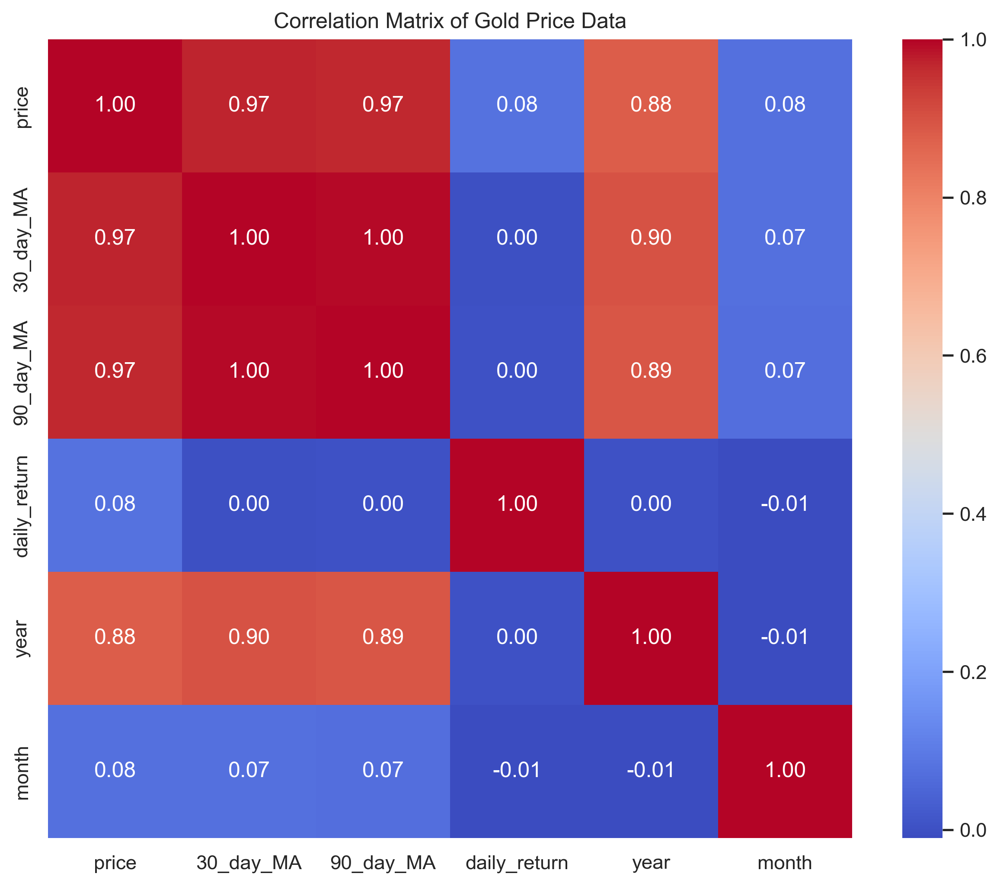

In [24]:
# Corelation Matrix
correlation_matrix = df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Gold Price Data')
plt.show()

In [25]:
df

,price,30_day_MA,90_day_MA,daily_return,year,month
date,,,,,,
2016-01-01,2252.60,NaN,NaN,NaN,2016,1
2016-01-02,2454.50,NaN,NaN,0.089630,2016,1
2016-01-03,2708.10,NaN,NaN,0.103320,2016,1
2016-01-04,2577.80,NaN,NaN,-0.048115,2016,1
2016-01-05,2597.75,NaN,NaN,0.007739,2016,1
...,...,...,...,...,...,...
2021-12-17,4394.40,4313.400000,4286.091111,-0.001227,2021,12
2021-12-18,4389.50,4312.273333,4288.745556,-0.001115,2021,12
2021-12-19,4389.50,4311.586667,4291.141111,0.000000,2021,12


In [26]:
df.drop(columns=['30_day_MA','90_day_MA','daily_return','year','month'],inplace=True)
df

,price
date,
2016-01-01,2252.60
2016-01-02,2454.50
2016-01-03,2708.10
2016-01-04,2577.80
2016-01-05,2597.75
...,...
2021-12-17,4394.40
2021-12-18,4389.50
2021-12-19,4389.50


In [27]:
#model building

In [28]:
df["t"] = df.index.strftime("%m")#month extraction

In [29]:
df

,price,t
date,,
2016-01-01,2252.60,01
2016-01-02,2454.50,01
2016-01-03,2708.10,01
2016-01-04,2577.80,01
2016-01-05,2597.75,01
...,...,...
2021-12-17,4394.40,12
2021-12-18,4389.50,12
2021-12-19,4389.50,12


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2182 entries, 2016-01-01 to 2021-12-21
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   price   2182 non-null   float64
 1   t       2182 non-null   object 
dtypes: float64(1), object(1)
memory usage: 51.1+ KB


In [31]:
df['log_of_price']=np.log(df['price'])
df

,price,t,log_of_price
date,,,
2016-01-01,2252.60,01,7.719840
2016-01-02,2454.50,01,7.805678
2016-01-03,2708.10,01,7.904003
2016-01-04,2577.80,01,7.854692
2016-01-05,2597.75,01,7.862401
...,...,...,...
2021-12-17,4394.40,12,8.388086
2021-12-18,4389.50,12,8.386971
2021-12-19,4389.50,12,8.386971


In [32]:
df['t'] = pd.to_numeric(df['t'], errors='coerce')
df['square_of_t']=np.square(df['t'])
df

,price,t,log_of_price,square_of_t
date,,,,
2016-01-01,2252.60,1,7.719840,1
2016-01-02,2454.50,1,7.805678,1
2016-01-03,2708.10,1,7.904003,1
2016-01-04,2577.80,1,7.854692,1
2016-01-05,2597.75,1,7.862401,1
...,...,...,...,...
2021-12-17,4394.40,12,8.388086,144
2021-12-18,4389.50,12,8.386971,144
2021-12-19,4389.50,12,8.386971,144


In [33]:
df['t_copy'] = df['t']
df = pd.get_dummies(df, columns=['t'])
df

,price,log_of_price,square_of_t,t_copy,t_1,t_2,t_3,t_4,t_5,t_6,t_7,t_8,t_9,t_10,t_11,t_12
date,,,,,,,,,,,,,,,,
2016-01-01,2252.60,7.719840,1,1,1,0,0,0,0,0,0,0,0,0,0,0
2016-01-02,2454.50,7.805678,1,1,1,0,0,0,0,0,0,0,0,0,0,0
2016-01-03,2708.10,7.904003,1,1,1,0,0,0,0,0,0,0,0,0,0,0
2016-01-04,2577.80,7.854692,1,1,1,0,0,0,0,0,0,0,0,0,0,0
2016-01-05,2597.75,7.862401,1,1,1,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-17,4394.40,8.388086,144,12,0,0,0,0,0,0,0,0,0,0,0,1
2021-12-18,4389.50,8.386971,144,12,0,0,0,0,0,0,0,0,0,0,0,1
2021-12-19,4389.50,8.386971,144,12,0,0,0,0,0,0,0,0,0,0,0,1


In [34]:
df = df.rename(columns={'t_copy': 't'})
df

,price,log_of_price,square_of_t,t,t_1,t_2,t_3,t_4,t_5,t_6,t_7,t_8,t_9,t_10,t_11,t_12
date,,,,,,,,,,,,,,,,
2016-01-01,2252.60,7.719840,1,1,1,0,0,0,0,0,0,0,0,0,0,0
2016-01-02,2454.50,7.805678,1,1,1,0,0,0,0,0,0,0,0,0,0,0
2016-01-03,2708.10,7.904003,1,1,1,0,0,0,0,0,0,0,0,0,0,0
2016-01-04,2577.80,7.854692,1,1,1,0,0,0,0,0,0,0,0,0,0,0
2016-01-05,2597.75,7.862401,1,1,1,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-17,4394.40,8.388086,144,12,0,0,0,0,0,0,0,0,0,0,0,1
2021-12-18,4389.50,8.386971,144,12,0,0,0,0,0,0,0,0,0,0,0,1
2021-12-19,4389.50,8.386971,144,12,0,0,0,0,0,0,0,0,0,0,0,1


In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2182 entries, 2016-01-01 to 2021-12-21
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         2182 non-null   float64
 1   log_of_price  2182 non-null   float64
 2   square_of_t   2182 non-null   int64  
 3   t             2182 non-null   int64  
 4   t_1           2182 non-null   uint8  
 5   t_2           2182 non-null   uint8  
 6   t_3           2182 non-null   uint8  
 7   t_4           2182 non-null   uint8  
 8   t_5           2182 non-null   uint8  
 9   t_6           2182 non-null   uint8  
 10  t_7           2182 non-null   uint8  
 11  t_8           2182 non-null   uint8  
 12  t_9           2182 non-null   uint8  
 13  t_10          2182 non-null   uint8  
 14  t_11          2182 non-null   uint8  
 15  t_12          2182 non-null   uint8  
dtypes: float64(2), int64(2), uint8(12)
memory usage: 110.8 KB


In [36]:
df.shape

(2182, 16)

In [37]:
Train = df.head(1746)
Test = df.tail(436)

In [38]:
#Linear Model
import statsmodels.formula.api as smf 

linear_model = smf.ols('price~t',data=Train).fit()
pred_linear =  pd.Series(linear_model.predict(pd.DataFrame(Test['t'])))
rmse_linear = np.sqrt(mean_squared_error(Test['price'], pred_linear))
rmse_linear

1262.013137766616

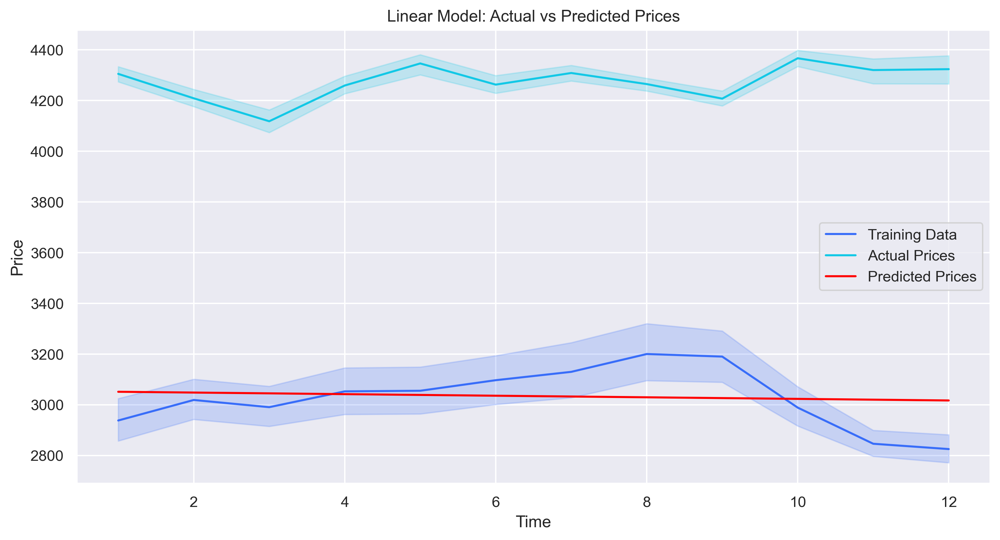

In [39]:
# Assuming 'Train' and 'Test' are your DataFrames and 'pred_linear' contains the predictions

# Plot the training data
plt.figure(figsize=(12, 6))
sns.lineplot(data=Train, x='t', y='price', label='Training Data')

# Plot the actual prices from the test data
sns.lineplot(data=Test, x='t', y='price', label='Actual Prices')

# Plot the predicted prices from the linear model
sns.lineplot(data=Test, x='t', y=pred_linear, label='Predicted Prices', color='red')

plt.xlabel('Time')
plt.ylabel('Price')
plt.title('Linear Model: Actual vs Predicted Prices')
plt.legend()
plt.show()

In [40]:
#Exponential

Exp = smf.ols('log_of_price~t',data=Train).fit()
pred_Exp = pd.Series(Exp.predict(pd.DataFrame(Test['t'])))
rmse_Exp = np.sqrt(mean_squared_error(Test['price'], pred_Exp))
rmse_Exp

4279.2513779372985

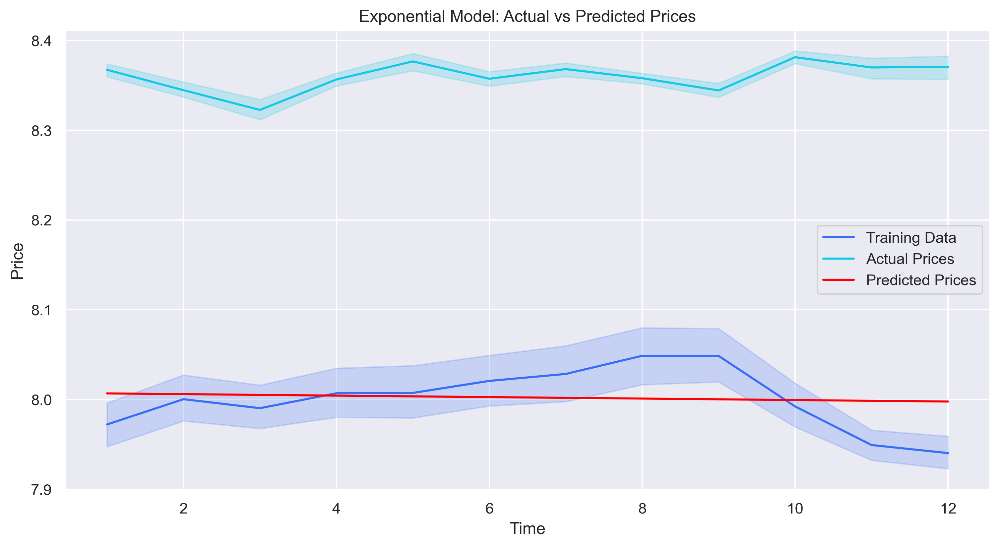

In [41]:
# Plot the training data
plt.figure(figsize=(12, 6))
sns.lineplot(data=Train, x='t', y='log_of_price', label='Training Data')

# Plot the actual prices from the test data
sns.lineplot(data=Test, x='t', y='log_of_price', label='Actual Prices')

# Plot the predicted prices from the linear model
sns.lineplot(data=Test, x='t', y=pred_Exp, label='Predicted Prices', color='red')

plt.xlabel('Time')
plt.ylabel('Price')
plt.title('Exponential Model: Actual vs Predicted Prices')
plt.legend()
plt.show()

In [42]:
#Quadratic 

Quad = smf.ols('price~t+square_of_t',data=Train).fit()
pred_Quad = pd.Series(Quad.predict(Test[["t","square_of_t"]]))
rmse_Quad = np.sqrt(mean_squared_error(Test['price'],pred_Quad))
rmse_Quad

1285.4634407234785

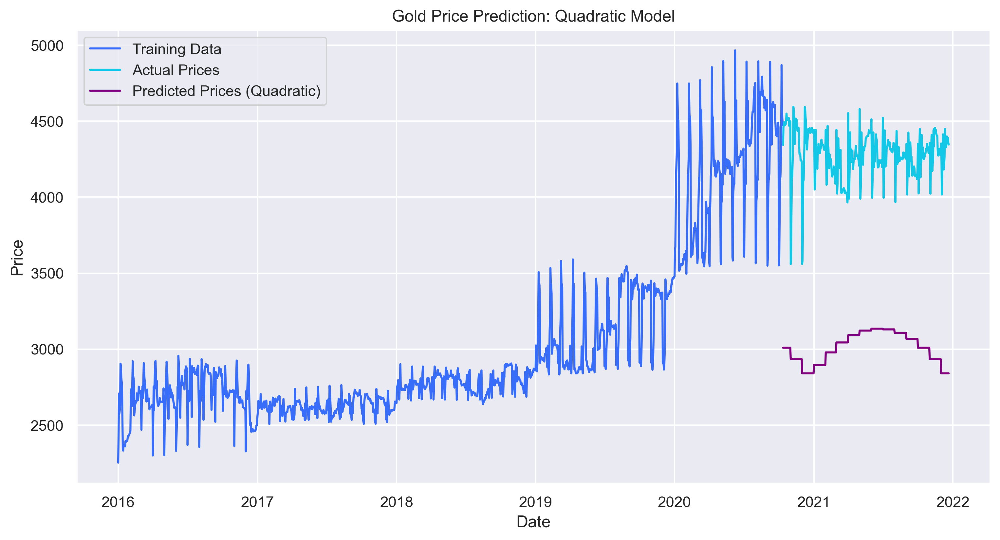

In [43]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(Train.index, Train['price'], label='Training Data')
plt.plot(Test.index, Test['price'], label='Actual Prices')
plt.plot(Test.index, pred_Quad, label='Predicted Prices (Quadratic)', color='purple')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Gold Price Prediction: Quadratic Model')
plt.legend()
plt.show()

In [44]:
#Additive seasonality 
add_sea = smf.ols('price~t_1+t_2+t_3+t_4+t_5+t_6+t_7+t_8+t_9+t_10+t_11',data=Train).fit()
pred_add_sea = pd.Series(add_sea.predict(Test[['t_1','t_2','t_3','t_4','t_5','t_6','t_7','t_8','t_9','t_10','t_11']]))
rmse_add_sea = np.sqrt(mean_squared_error(Test['price'], pred_add_sea))
rmse_add_sea

1297.55685200121

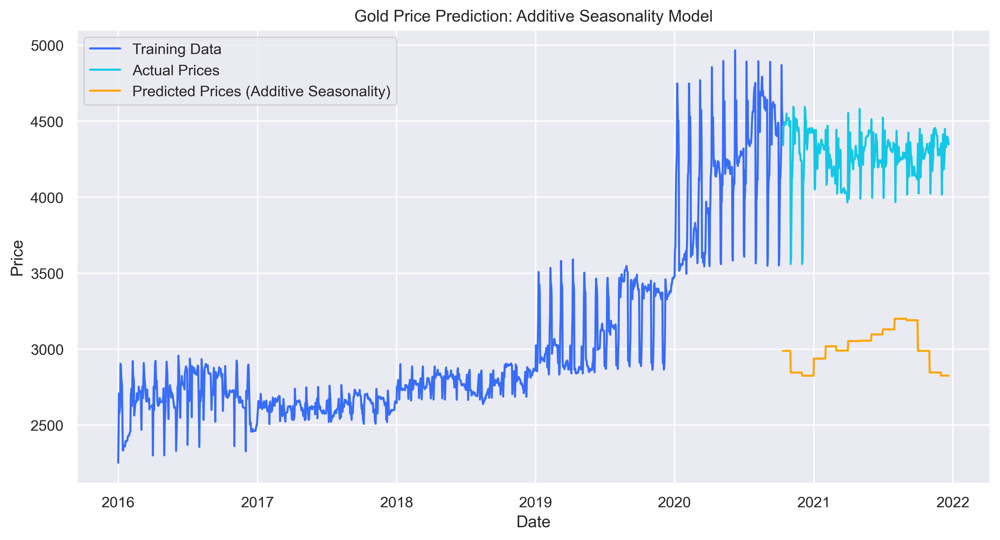

In [45]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(Train.index, Train['price'], label='Training Data')
plt.plot(Test.index, Test['price'], label='Actual Prices')
plt.plot(Test.index, pred_add_sea, label='Predicted Prices (Additive Seasonality)', color='orange')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Gold Price Prediction: Additive Seasonality Model')
plt.legend()
plt.show()

In [46]:
#Additive Seasonality Quadratic 

add_sea_Quad = smf.ols('price~t+square_of_t+t_1+t_2+t_3+t_4+t_5+t_6+t_7+t_8+t_9+t_10+t_11',data=Train).fit()
pred_add_sea_quad = pd.Series(add_sea_Quad.predict(Test[['t_1','t_2','t_3','t_4','t_5','t_6','t_7','t_8','t_9','t_10','t_11','t','square_of_t']]))
rmse_add_sea_quad = np.sqrt(mean_squared_error(Test['price'], pred_add_sea_quad))
rmse_add_sea_quad

1297.5568520018173

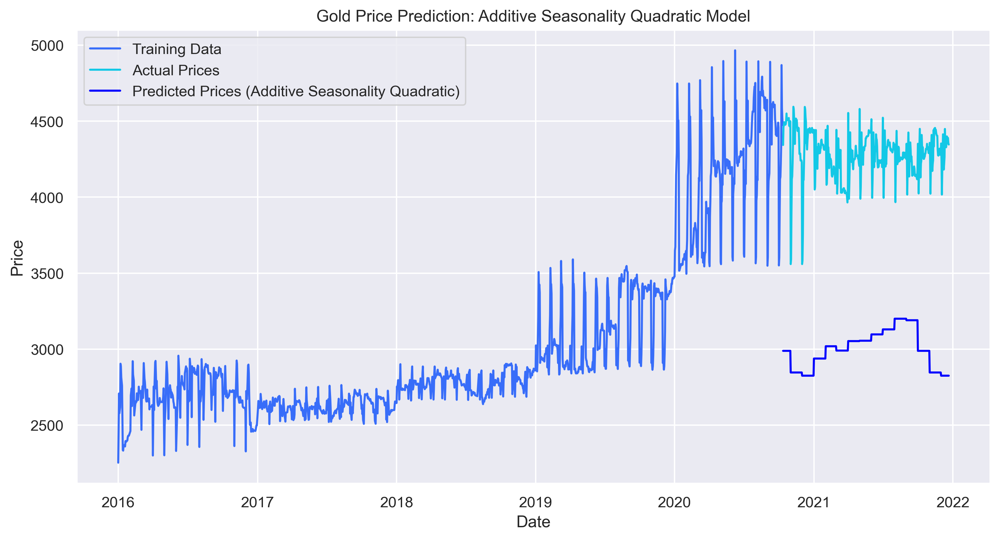

In [47]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(Train.index, Train['price'], label='Training Data')
plt.plot(Test.index, Test['price'], label='Actual Prices')
plt.plot(Test.index, pred_add_sea_quad, label='Predicted Prices (Additive Seasonality Quadratic)', color='blue')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Gold Price Prediction: Additive Seasonality Quadratic Model')
plt.legend()
plt.show()

In [48]:
#Multiplicative Seasonality 

Mul_Add_sea = smf.ols('log_of_price~t+t_1+t_2+t_3+t_4+t_5+t_6+t_7+t_8+t_9+t_10+t_11',data = Train).fit()
pred_Mult_add_sea = pd.Series(Mul_Add_sea.predict(Test))
rmse_Mult_add_sea = np.sqrt(mean_squared_error(Test['price'], pred_Mult_add_sea))
rmse_Mult_add_sea 

4279.259584219293

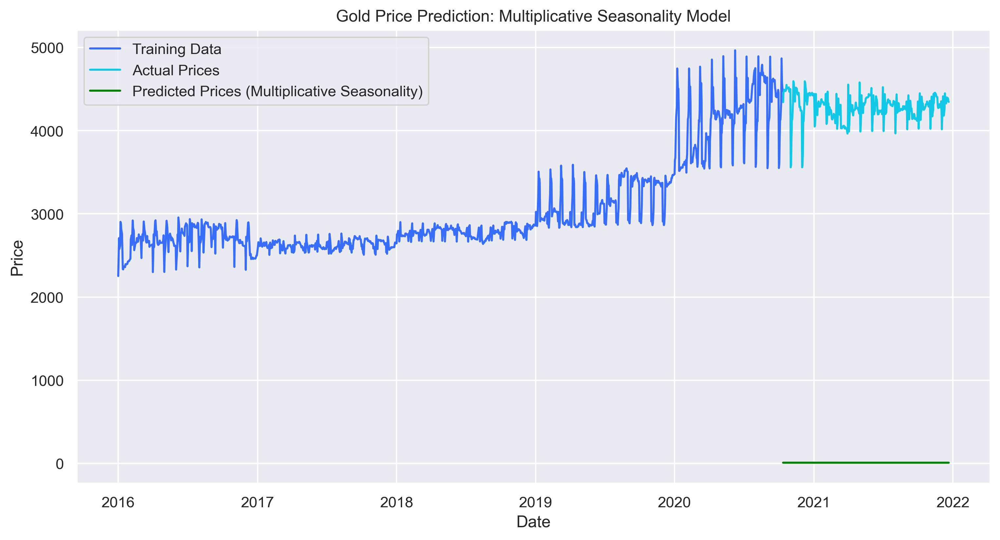

In [49]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(Train.index, Train['price'], label='Training Data')
plt.plot(Test.index, Test['price'], label='Actual Prices')
plt.plot(Test.index, pred_Mult_add_sea, label='Predicted Prices (Multiplicative Seasonality)', color='green')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Gold Price Prediction: Multiplicative Seasonality Model')
plt.legend()
plt.show()

In [50]:
#Compare the results 

data1 = {"MODEL":pd.Series(["rmse_linear","rmse_Exp","rmse_Quad","rmse_add_sea","rmse_add_sea_quad","rmse_Mult_sea"]),"RMSE_Values":pd.Series([rmse_linear,rmse_Exp,rmse_Quad,rmse_add_sea,rmse_add_sea_quad,rmse_Mult_add_sea])}
table_rmse1=pd.DataFrame(data1)
table_rmse1.sort_values(['RMSE_Values'])

,MODEL,RMSE_Values
0,rmse_linear,1262.013138
2,rmse_Quad,1285.463441
3,rmse_add_sea,1297.556852
4,rmse_add_sea_quad,1297.556852
1,rmse_Exp,4279.251378
5,rmse_Mult_sea,4279.259584


In [51]:
################################################################################################################################

# Arima Model

In [52]:
df=pd.read_csv("Gold_data (1).csv")
df

,date,price
0,2016-01-01,2252.60
1,2016-01-02,2454.50
2,2016-01-03,2708.10
3,2016-01-04,2577.80
4,2016-01-05,2597.75
...,...,...
2177,2021-12-17,4394.40
2178,2021-12-18,4389.50
2179,2021-12-19,4389.50
2180,2021-12-20,4354.10


In [53]:
df['date'] = pd.to_datetime(df['date'])

In [54]:
df.set_index('date', inplace=True)

In [55]:
# Check stationarity of the data

<Axes: xlabel='date'>

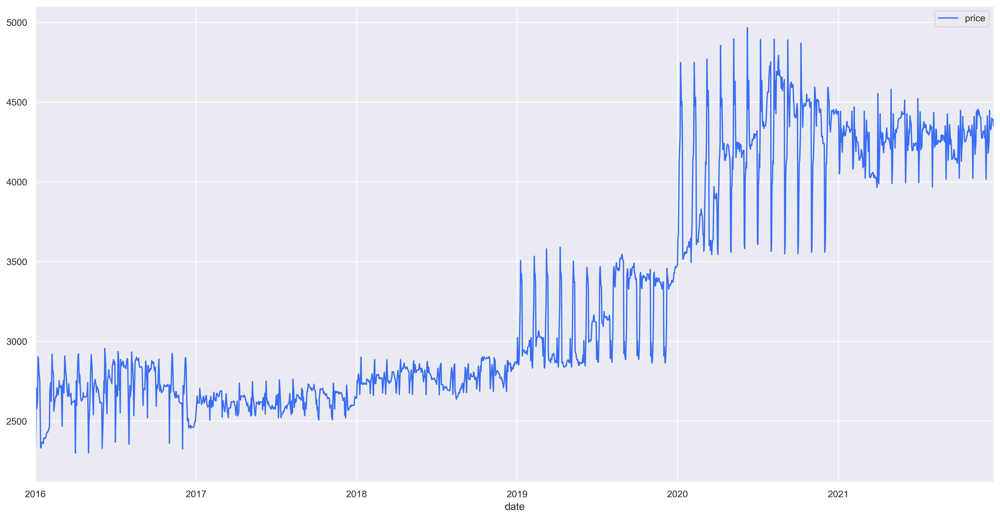

In [56]:
df.plot()

In [57]:
adfuller(df['price'])[1].round(5)

0.92409

Null hypothesis: Data is Non stationary

Alternate Hypothesis: Data is Stationary

- If p< 0.05 ; Data is stationary

- if p>0.05; Data is not stationary

According the p-value, the dataset is non stationary as the p value is more than alpha value.

Arima model building.

- ARIMA is composed of 3 terms(Auto-Regression(p) + Integrated(d) + Moving-Average(q))
- First, we need to find out the order of arima model.

In [58]:
#find out order of arima

In [59]:
order = auto_arima(df['price'])

In [60]:
order#(p,d,q)=>p=PACF,d=differencing method value,q=ACF.

ARIMA(order=(5, 1, 5), scoring_args={}, suppress_warnings=True)

In [61]:
df.shape

(2182, 1)

In [62]:
#Split the data

In [63]:
train = df.head(1746)
test = df.tail(436)

In [64]:
train.shape

(1746, 1)

In [65]:
test.shape

(436, 1)

In [66]:
test_range = test['price'].reset_index(drop=True)

In [67]:
# Train the ARIMA model
model_arima = ARIMA(train['price'], order=(5,1,5)).fit(method_kwargs={"maxiter": 200})

# Predict on the entire dataset (train + test)
full_data = pd.concat([train, test])
ypred_arima = model_arima.predict(start=0, end=len(full_data)-1)

# Compute RMSE
rmse_arima = np.sqrt(mean_squared_error(full_data['price'], ypred_arima))
rmse_arima

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



134.6694518019079

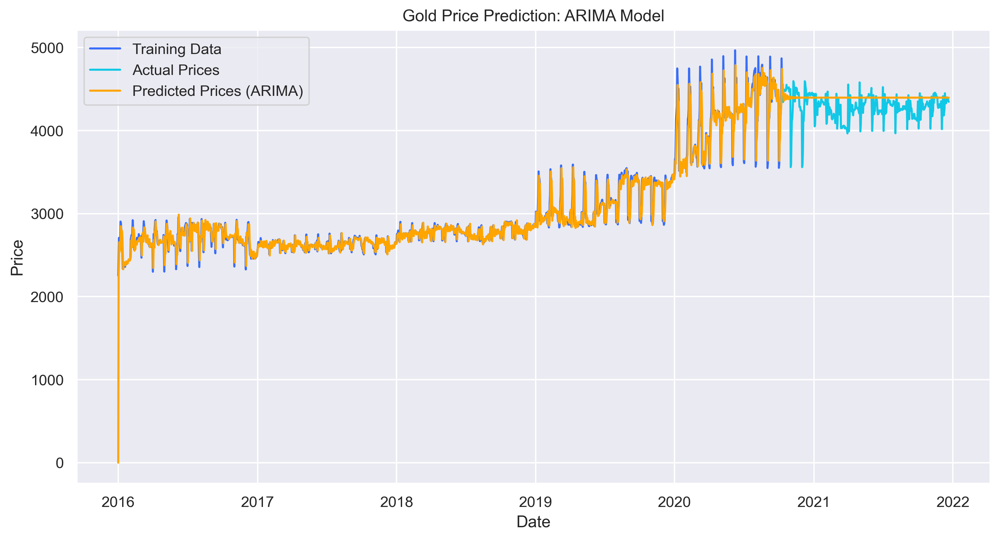

In [68]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['price'], label='Training Data')
plt.plot(test.index, test['price'], label='Actual Prices')
plt.plot(full_data.index, ypred_arima, label='Predicted Prices (ARIMA)', color='orange')  # Changed color to orange
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Gold Price Prediction: ARIMA Model')
plt.legend()
plt.show()

In [69]:
# Autoregressive (AR) Model
from statsmodels.tsa.ar_model import AutoReg

model_ar = AutoReg(train['price'], lags=5).fit()
ypred_ar = model_ar.predict(start=1746, end=2181)
rmse_ar = np.sqrt(mean_squared_error(test_range, ypred_ar))
rmse_ar

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



998.7399352770503

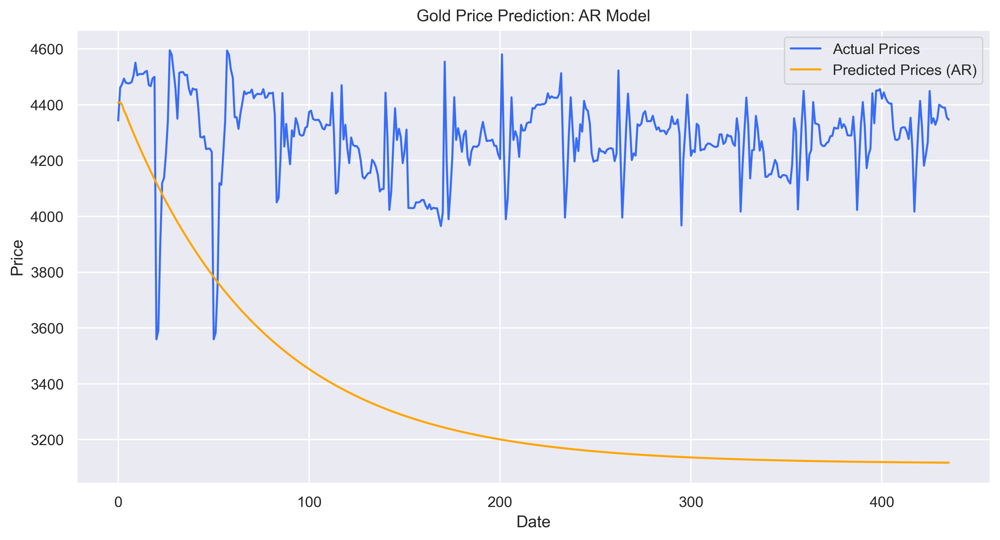

In [70]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(test_range.index, test_range, label='Actual Prices')
plt.plot(test_range.index, ypred_ar, label='Predicted Prices (AR)', color='orange')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Gold Price Prediction: AR Model')
plt.legend()
plt.show()

In [71]:
# Moving Average (MA) Model
model_ma = ARIMA(train['price'], order=(0, 0, 5)).fit()
ypred_ma = model_ma.predict(start=1746, end=2181)
rmse_ma = np.sqrt(mean_squared_error(test_range, ypred_ma))
rmse_ma

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



1255.009329727911

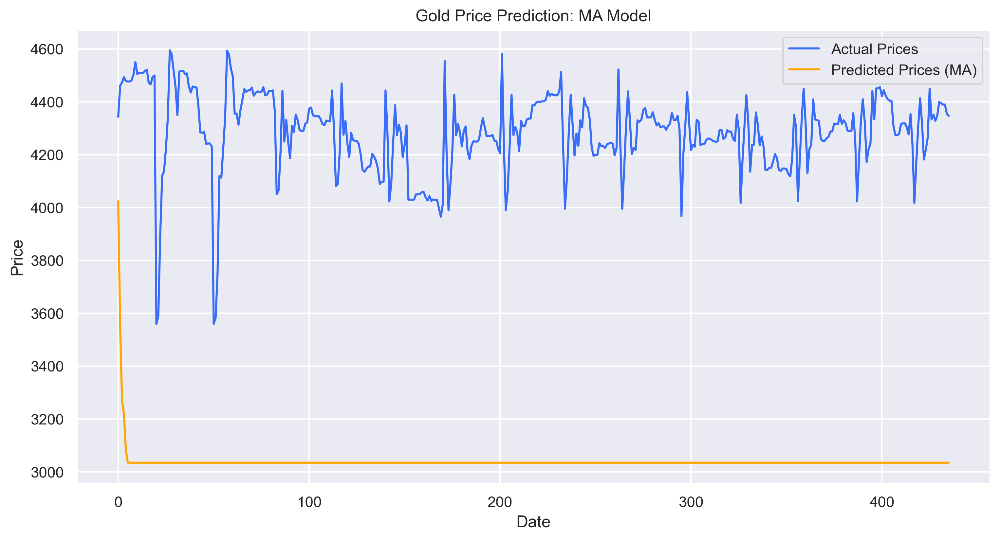

In [72]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(test_range.index, test_range, label='Actual Prices')
plt.plot(test_range.index, ypred_ma, label='Predicted Prices (MA)', color='orange')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Gold Price Prediction: MA Model')
plt.legend()
plt.show()

In [73]:
# Seasonal ARIMA (SARIMA) Model
from statsmodels.tsa.statespace.sarimax import SARIMAX

model_sarima = SARIMAX(train['price'], order=(5, 1, 5), seasonal_order=(1, 1, 1, 12)).fit()
ypred_sarima = model_sarima.predict(start=1746, end=2181)
rmse_sarima = np.sqrt(mean_squared_error(test_range, ypred_sarima))
rmse_sarima

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



407.04992882344834

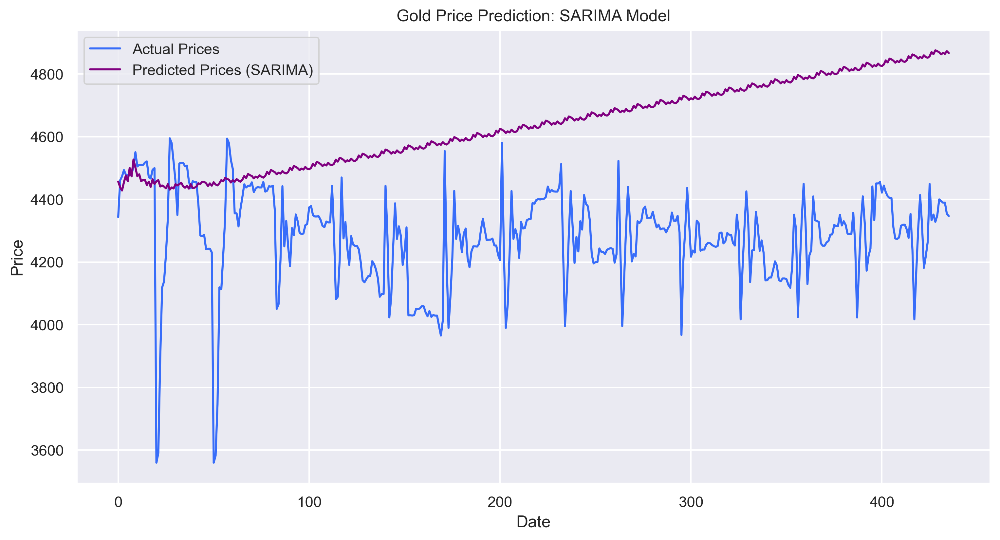

In [74]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(test_range.index, test_range, label='Actual Prices')
plt.plot(test_range.index, ypred_sarima, label='Predicted Prices (SARIMA)', color='purple')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Gold Price Prediction: SARIMA Model')
plt.legend()
plt.show()

In [75]:
# Holt-Winters Exponential Smoothing (HWES)
from statsmodels.tsa.holtwinters import ExponentialSmoothing

model_hw = ExponentialSmoothing(train['price'], seasonal='add', seasonal_periods=12).fit()
ypred_hw = model_hw.predict(start=1746, end=2181)
rmse_hw = np.sqrt(mean_squared_error(test_range, ypred_hw))
rmse_hw

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



259.7163541302777

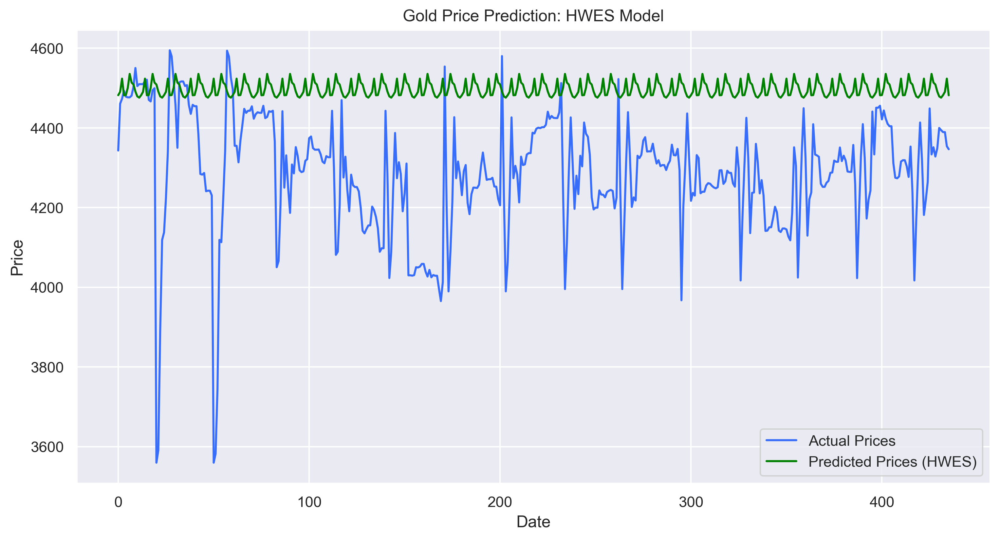

In [76]:
# Plotting
plt.figure(figsize=(12, 6))
plt.plot(test_range.index, test_range, label='Actual Prices')
plt.plot(test_range.index, ypred_hw, label='Predicted Prices (HWES)', color='green')
plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Gold Price Prediction: HWES Model')
plt.legend()
plt.show()

In [77]:
# Compare the results
data2 = {
    "MODEL": pd.Series(["ARIMA", "AR", "MA", "SARIMA", "HWES"]),
    "RMSE_Values": pd.Series([rmse_arima, rmse_ar, rmse_ma, rmse_sarima, rmse_hw])
}
table_rmse2 = pd.DataFrame(data2)
table_rmse2 = table_rmse2.sort_values(by=['RMSE_Values'])

In [78]:
combined_table_rmse = pd.concat([table_rmse1, table_rmse2])

In [79]:
combined_table_rmse = combined_table_rmse.sort_values(by=['RMSE_Values'])

In [80]:
combined_table_rmse.reset_index(drop=True, inplace=True)

In [81]:
print(combined_table_rmse)

                MODEL  RMSE_Values
0               ARIMA   134.669452
1                HWES   259.716354
2              SARIMA   407.049929
3                  AR   998.739935
4                  MA  1255.009330
5         rmse_linear  1262.013138
6           rmse_Quad  1285.463441
7        rmse_add_sea  1297.556852
8   rmse_add_sea_quad  1297.556852
9            rmse_Exp  4279.251378
10      rmse_Mult_sea  4279.259584


In [82]:
#Arima model has the best (rmse) root mean squared error value

- ARIMA: Combines autoregression, differencing, and moving averages to model time series data.
- HWES (Holt-Winters Exponential Smoothing): Uses level, trend, and seasonality components for forecasting.
- SARIMA: Extends ARIMA by incorporating seasonal differencing and seasonal autoregressive/moving average terms.
- AR (Autoregressive): Predicts future values based on a linear combination of past values.
- MA (Moving Average): Models the time series as a linear combination of past forecast errors.
- Linear Regression: Fits a straight line to the data to predict future values.
- Quadratic Regression: Fits a quadratic curve to the data for forecasting.
- Additive Seasonality: Models the data as a sum of trend, seasonality, and residuals.
- Additive Seasonality with Quadratic Trend: Combines quadratic trend and additive seasonal components.
- Exponential Smoothing: Applies exponentially decreasing weights to past observations.
- Multiplicative Seasonality: Models the data as a product of trend, seasonality, and residuals

In [83]:
import pickle
from statsmodels.tsa.arima.model import ARIMA

# Load the trained ARIMA model
model_arima = ARIMA(df['price'], order=(5,1,5)).fit(method_kwargs={"maxiter": 200})
with open('model_arima.pkl', 'wb') as pkl:
    pickle.dump(model_arima, pkl)


C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\rites\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

